# 2.2 Feature analysis

In this iteration for machine learning we work with more features (23). We automatically select our best features.

### 1. Adding libraries we need

In [1]:
import os
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
from sklearn.feature_selection import SelectKBest, chi2
import warnings

warnings.filterwarnings('ignore', category=FutureWarning)

### 2. Read in the feature dataset from the result of 1.1 notebook

In [2]:
directory = "../dataset-numpy/"

dataset = pd.read_csv(os.path.join(directory, '1.1 - features.csv'), delimiter=',', header=0)

### 3. Group up the images by label with a dictionary

With this step we can create separate pandas dataframes for each label. This will make it easier to do the imputation.

In [3]:
unique_labels = dataset['label'].unique()

images_dict = {elem : pd.DataFrame() for elem in unique_labels }

for key in images_dict.keys():
    images_dict[key] = dataset[:][dataset.label == key]

for label, image_set in images_dict.items():
    print(f'=====[Label: {label}]=====')
    print(f'num of images: {len(image_set)}')
    print(f'missing features:\n{image_set.isnull().sum()}')
    print(image_set.describe())
    print()

=====[Label: joy]=====
num of images: 114
missing features:
label                       0
area                        0
area_filled                 0
area_convex                 0
axis_major_length           0
axis_minor_length           0
eccentricity                0
equivalent_diameter_area    0
extent                      0
feret_diameter_max          0
perimeter                   0
solidity                    0
holes                       0
h_sym_err_percent           0
v_sym_err_percent           0
pixelsum_tl                 0
pixelsum_tm                 0
pixelsum_tr                 0
pixelsum_ml                 0
pixelsum_mm                 0
pixelsum_mr                 0
pixelsum_bl                 0
pixelsum_bm                 0
pixelsum_br                 0
dtype: int64
               area   area_filled   area_convex  axis_major_length  \
count    114.000000    114.000000    114.000000         114.000000   
mean    6273.149123   7074.938596   9903.403509         149.059570 

As we can see, there is no missing data

### 4. Check corelation between features

We print the Pearson correlation matrix to see if there is any correlation between the features. We can see that there is a strong negative correlation between the two features.

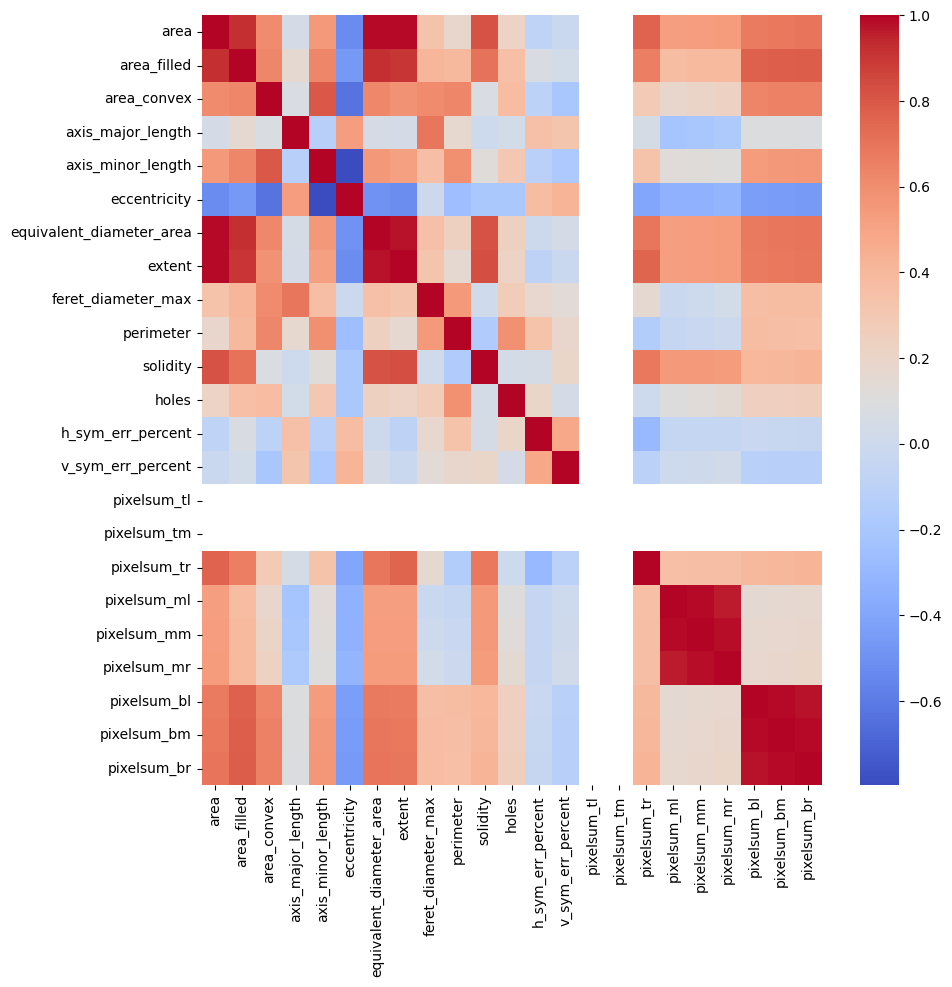

In [4]:
# Print Pearson correlation matrix
labels = [col for col in dataset.columns if col != 'label']

corr = dataset[labels].corr()

plt.figure(figsize=(10, 10))
sns.heatmap(corr, annot=False, fmt='.2f', cmap='coolwarm')
plt.show()

### 5. Describe the data in graphs for each label

We first visualize all our features against each other using a pairplot. With this, we can identify if there are clear groups of labels

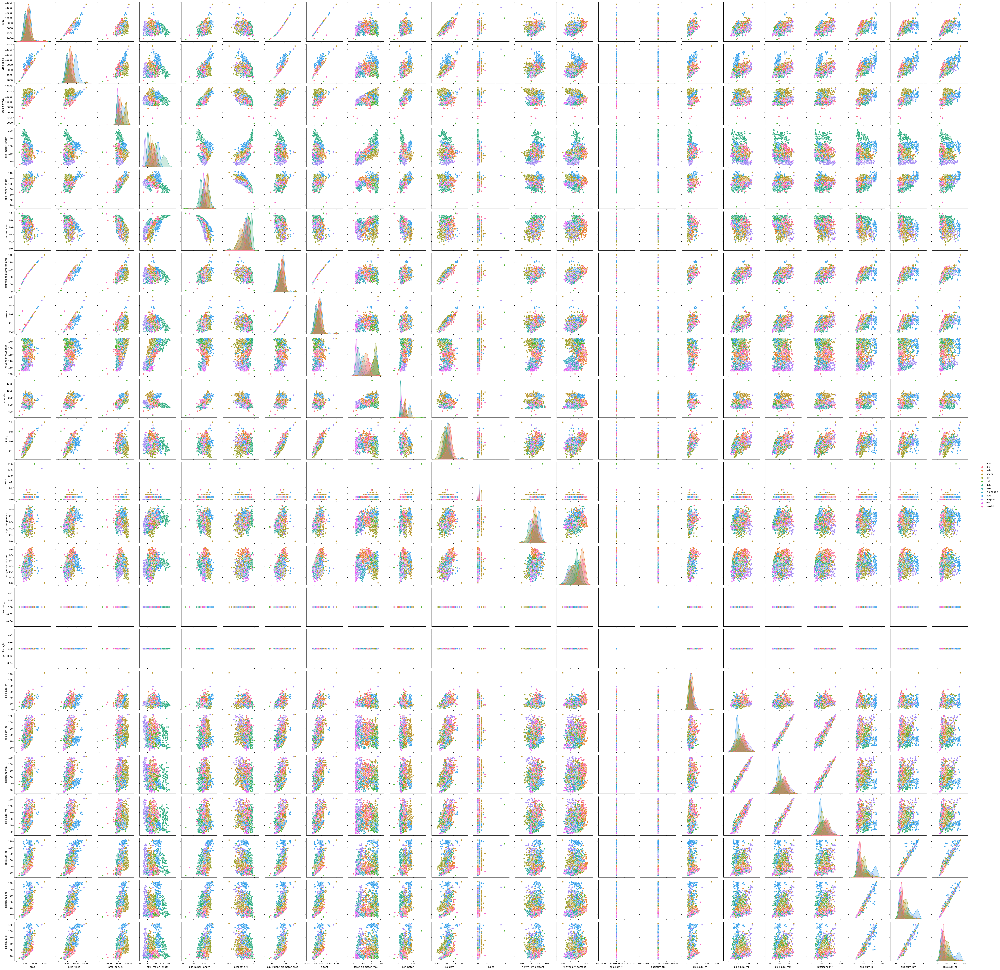

In [5]:
sns.pairplot(dataset, hue="label")

We also check how much data we have for each image

<Axes: xlabel='label', ylabel='count'>

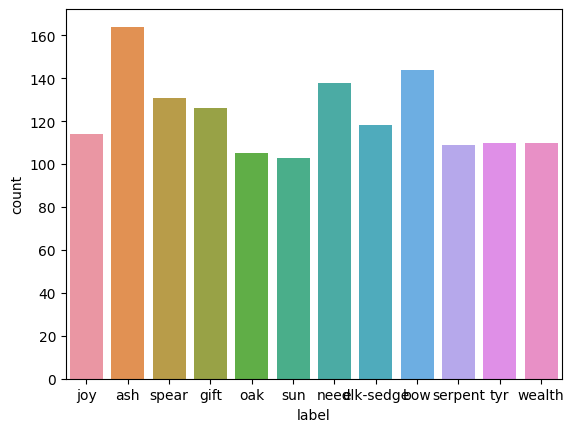

In [6]:
sns.countplot(data=dataset, x='label')

A unique and simple-to-visualize feature is the hole count. So we create a histogram for each rune's detected hole count

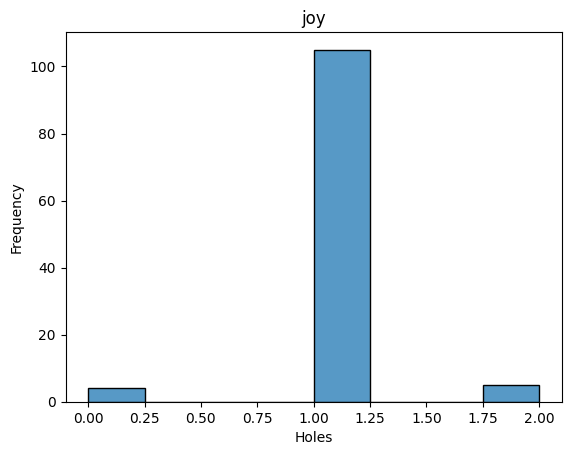

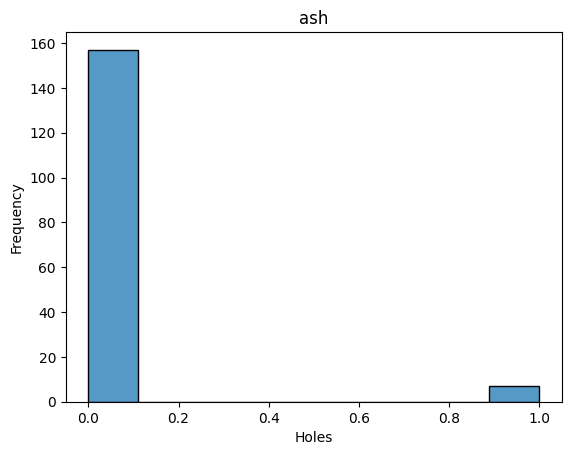

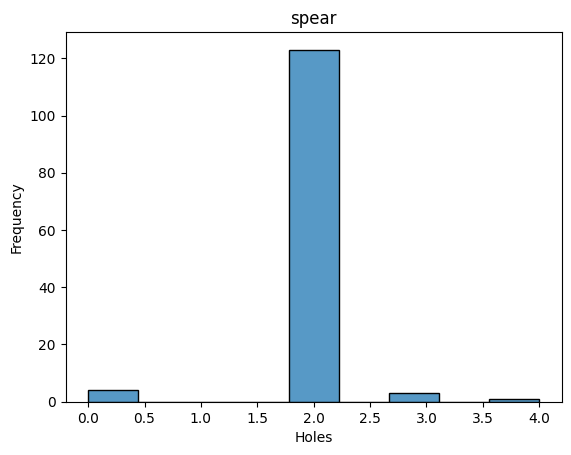

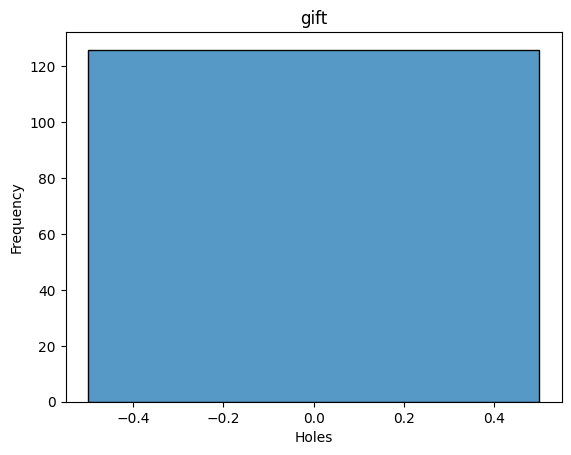

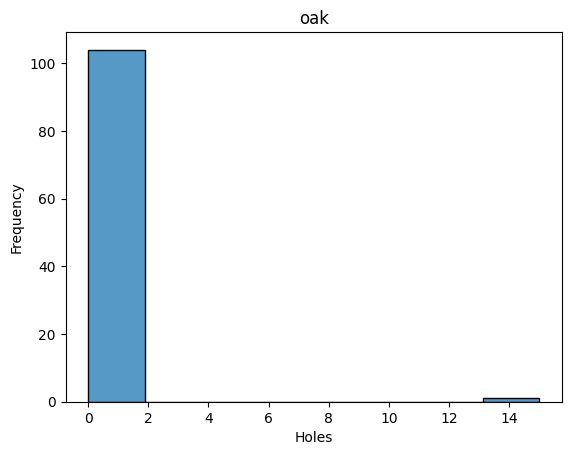

...

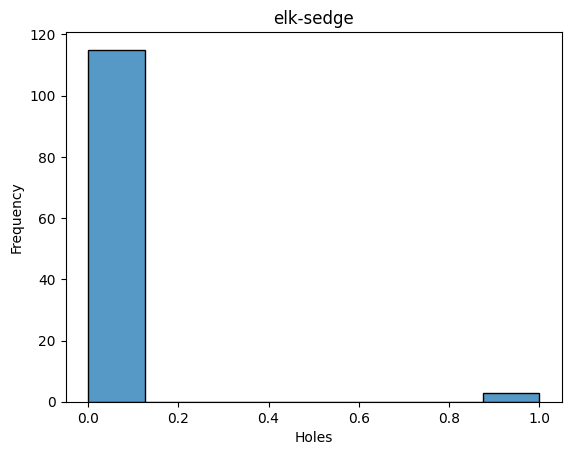

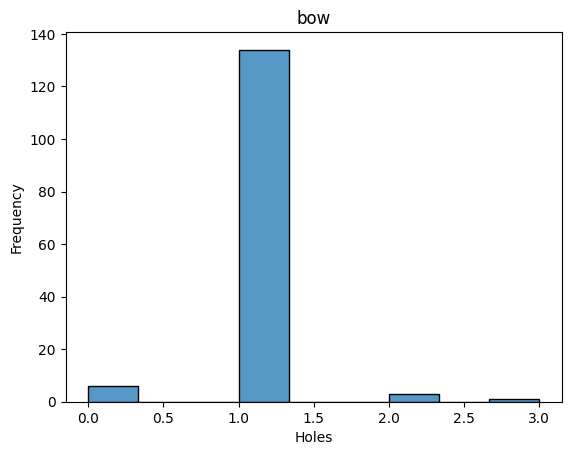

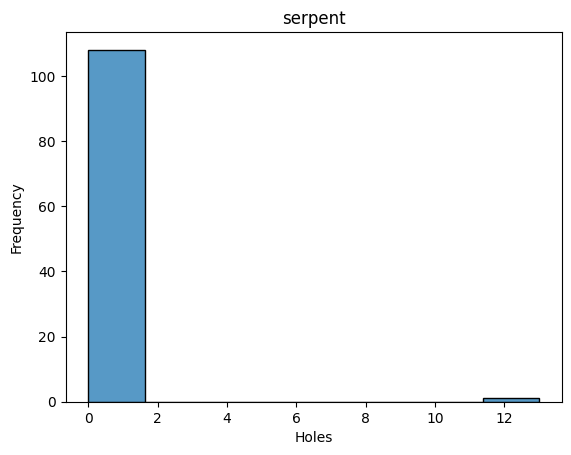

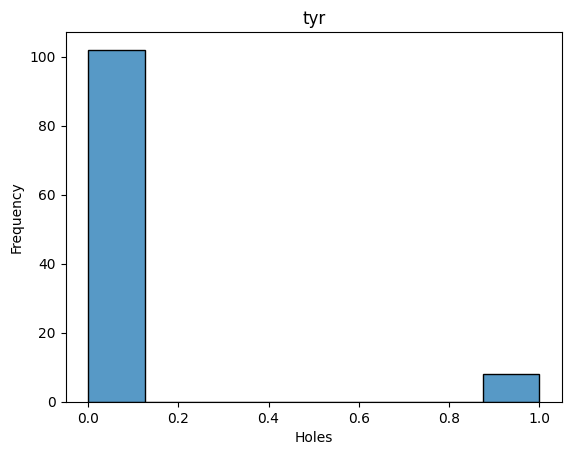

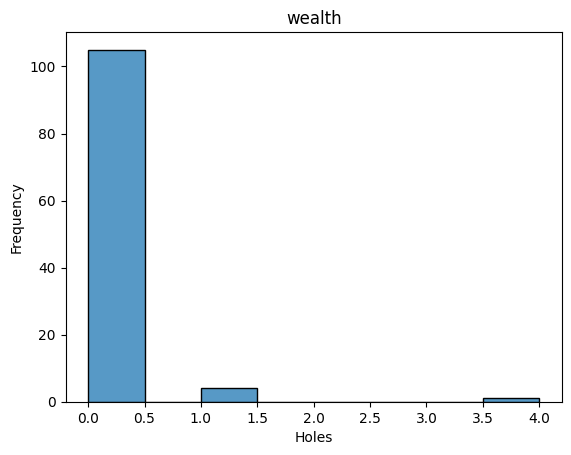

In [7]:
# create a subplot for each label and draw a histogram of the 'holes' feature
for label, image_set in images_dict.items():
    plt.figure()
    sns.histplot(data=image_set, x='holes')
    plt.title(label)
    plt.xlabel('Holes')
    plt.ylabel('Frequency')
    plt.show()
    plt.close()

Now we take a look at all other features to see potential outliers

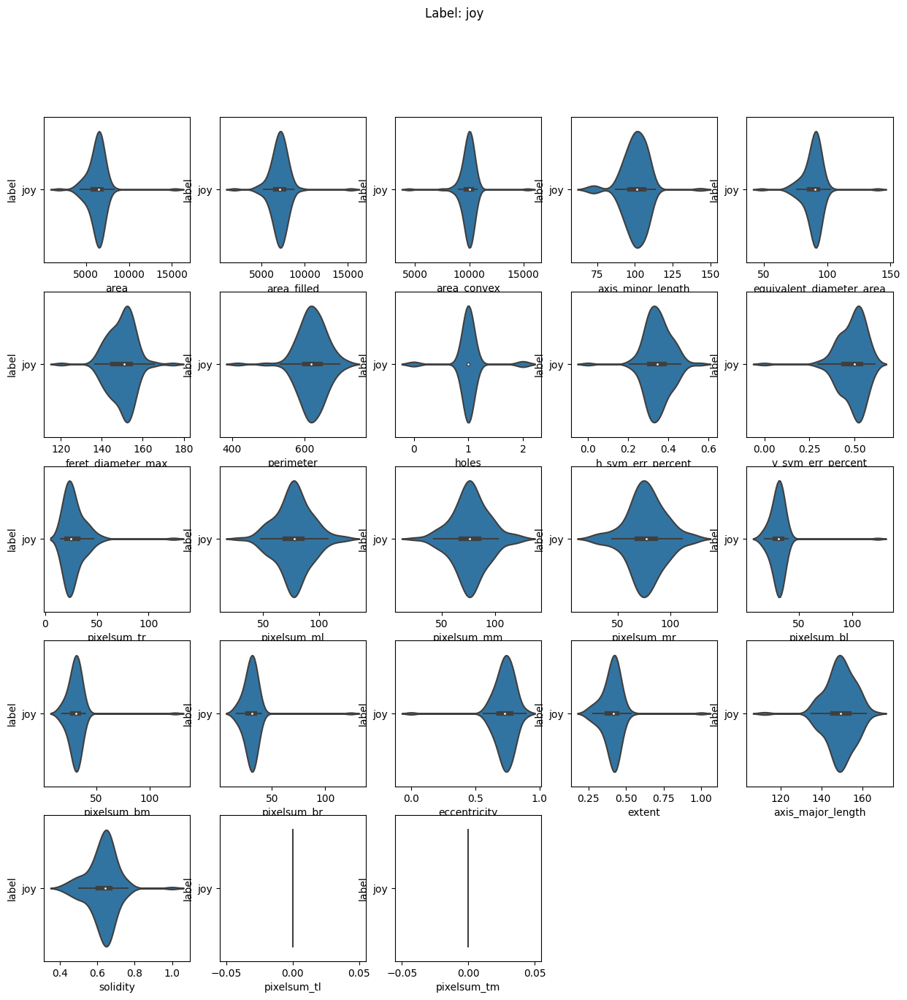

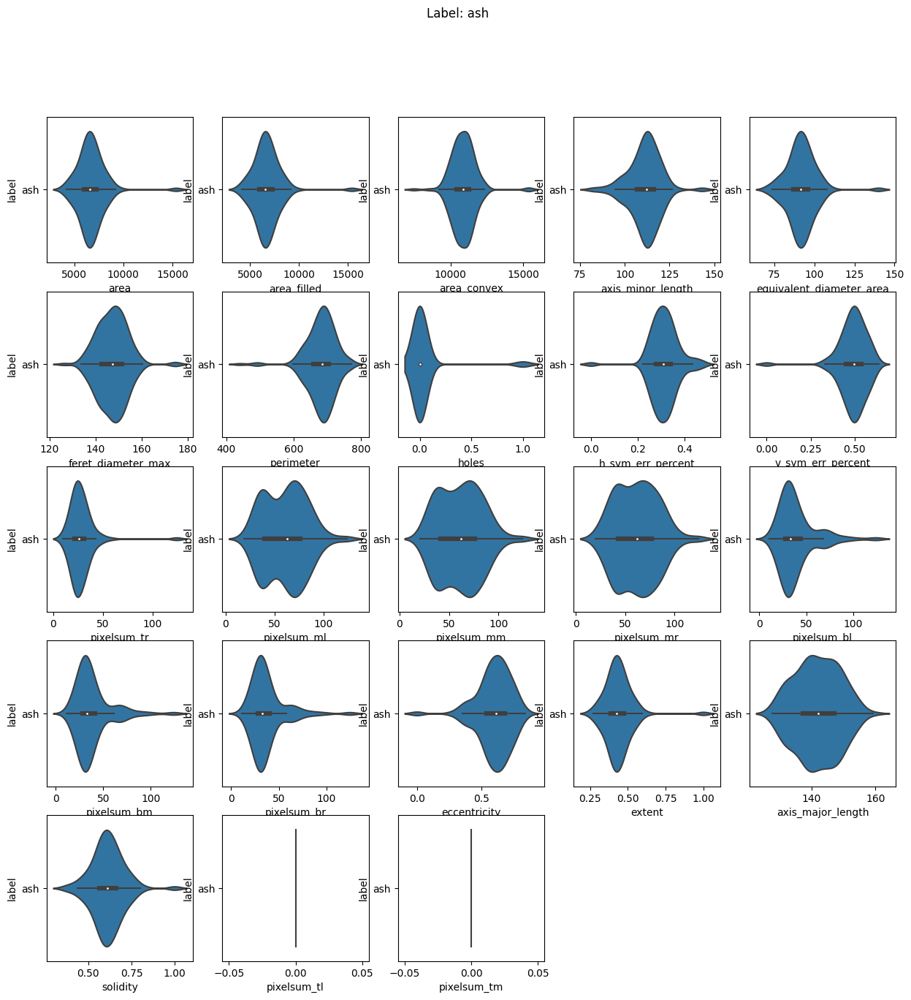

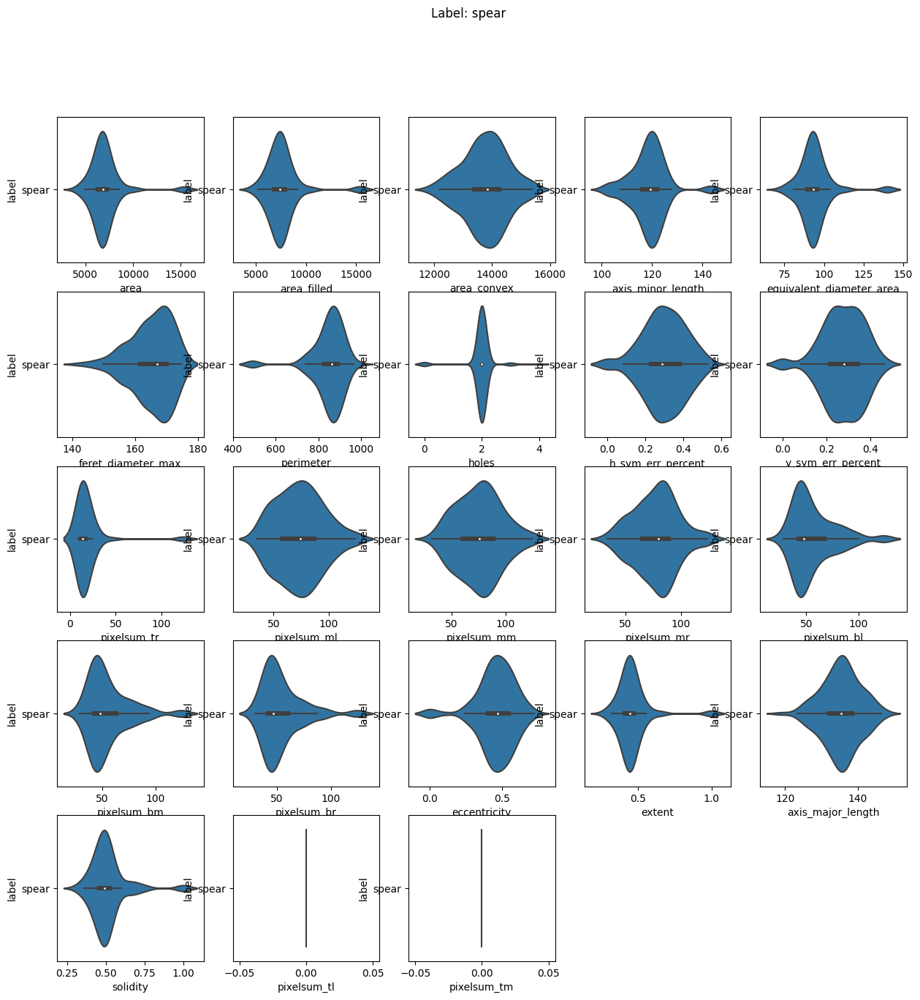

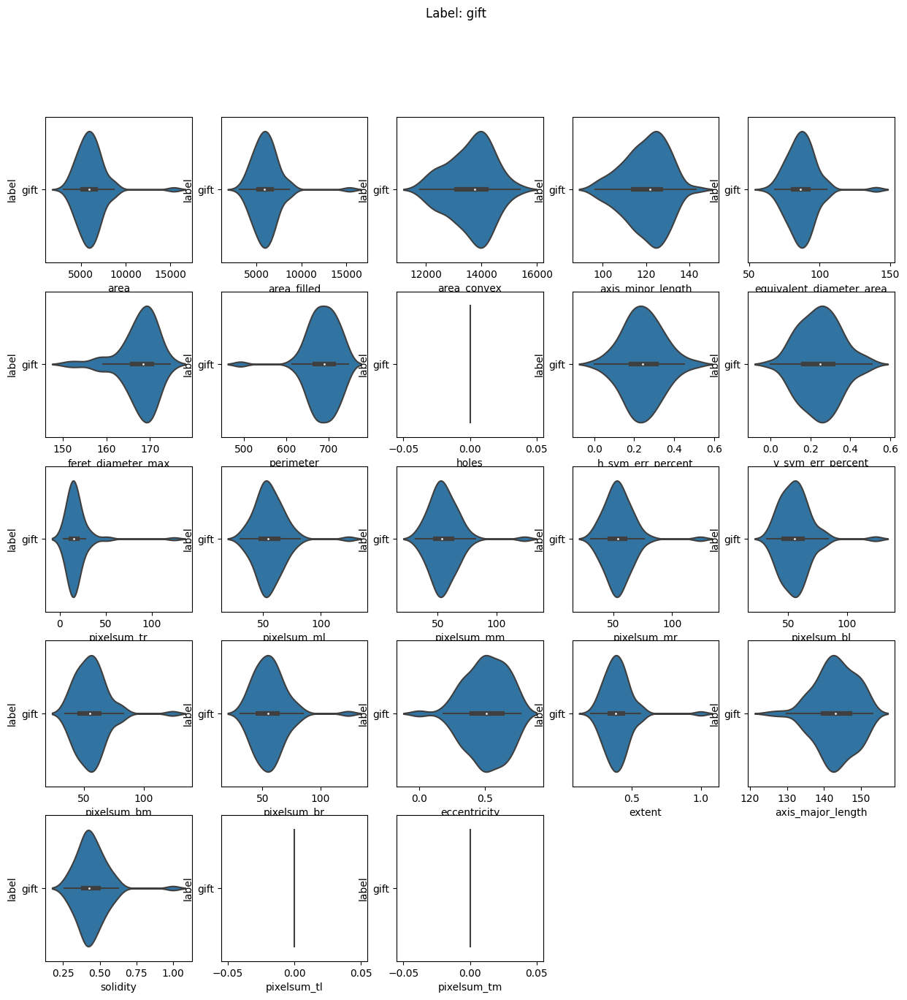

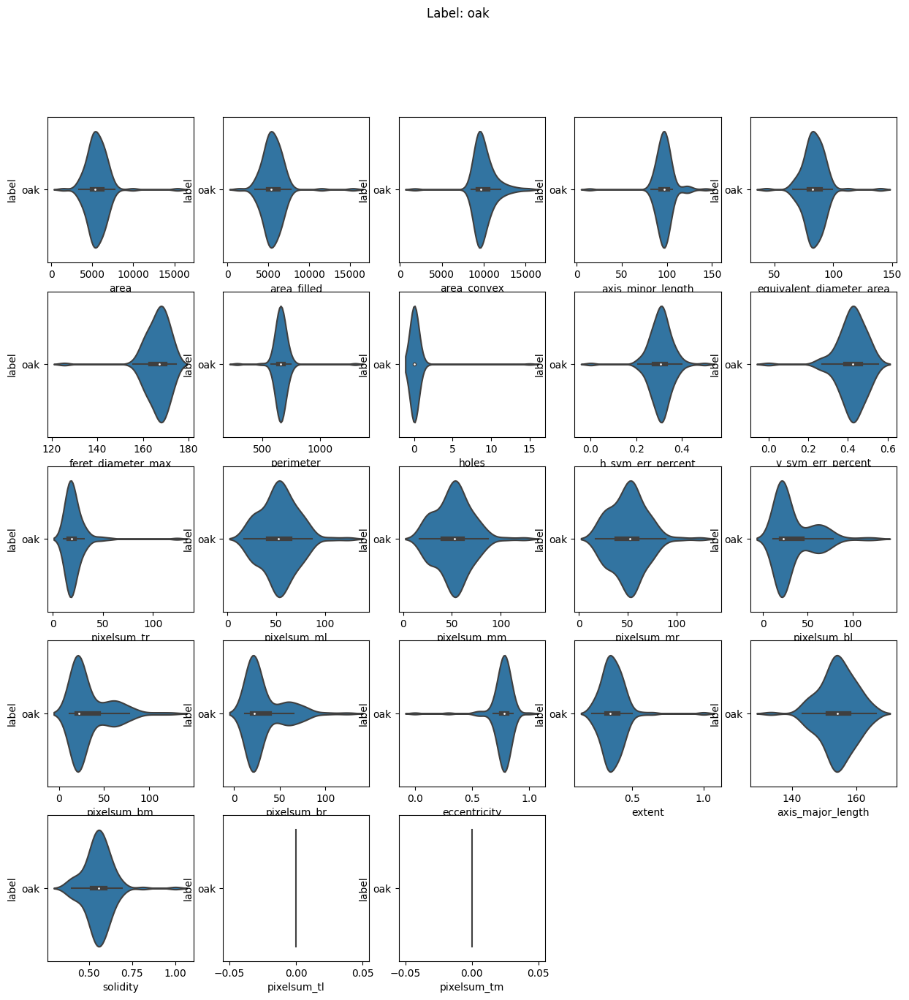

...

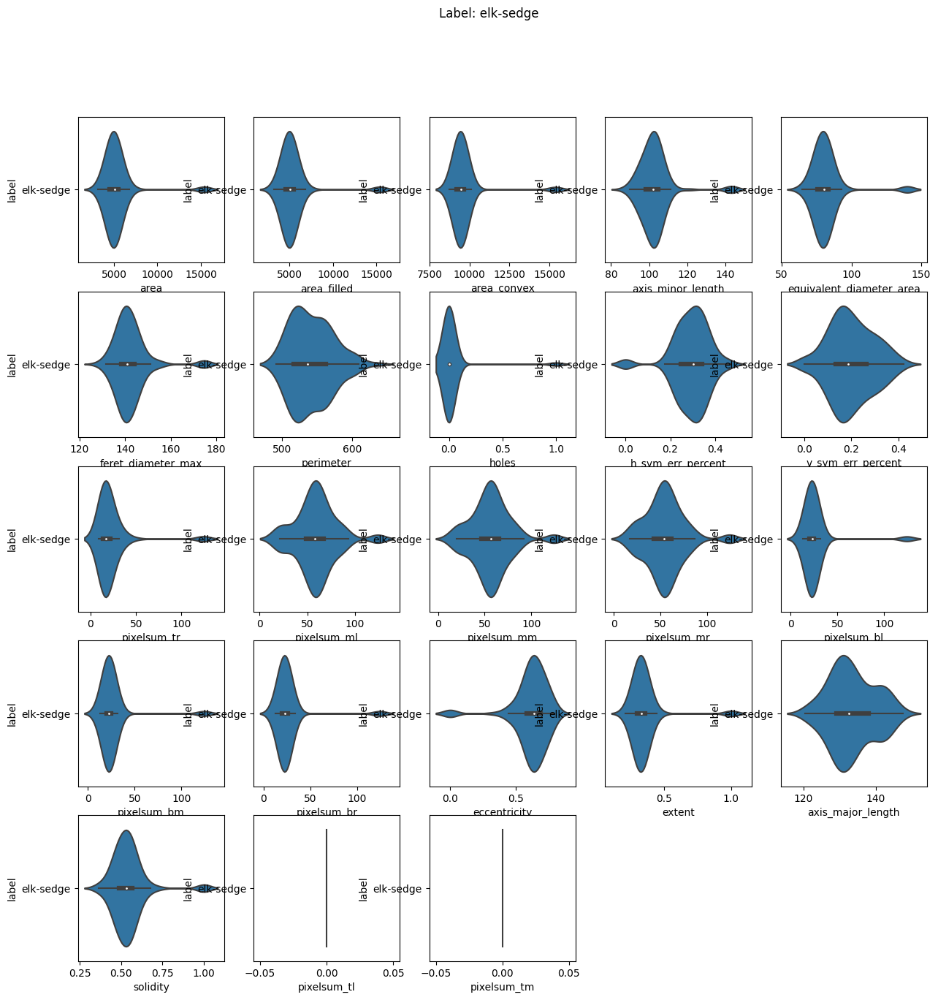

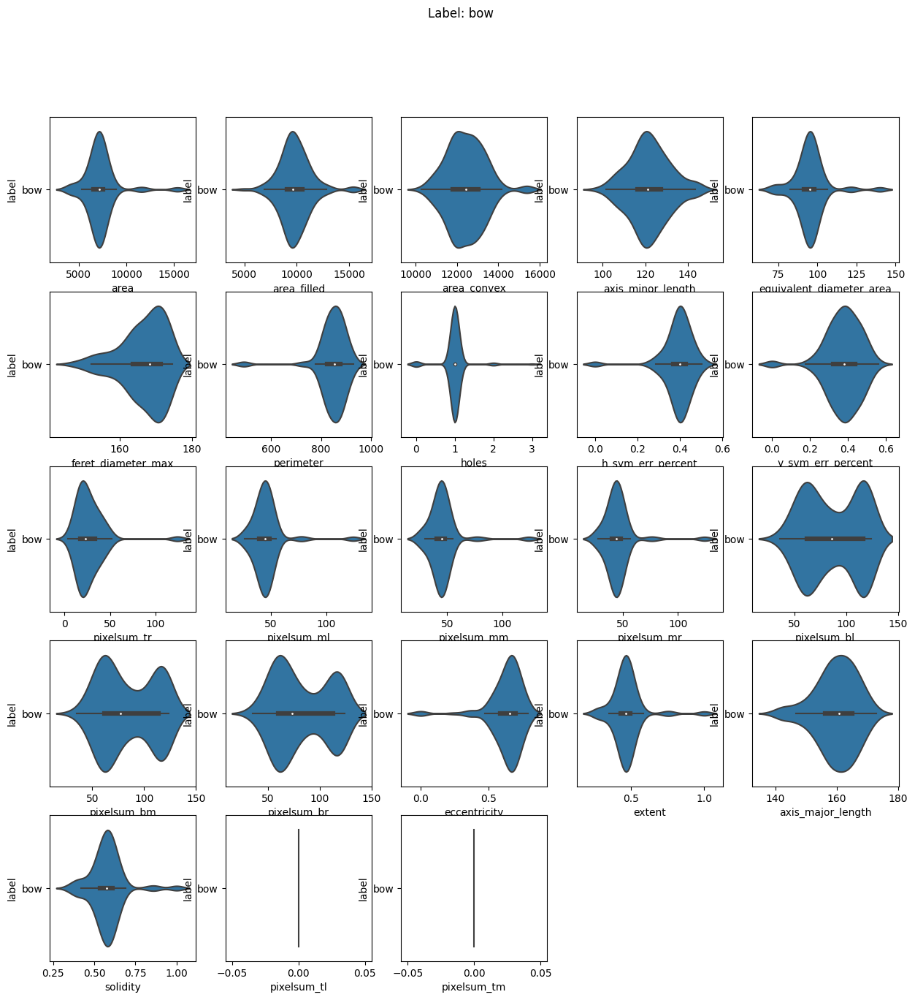

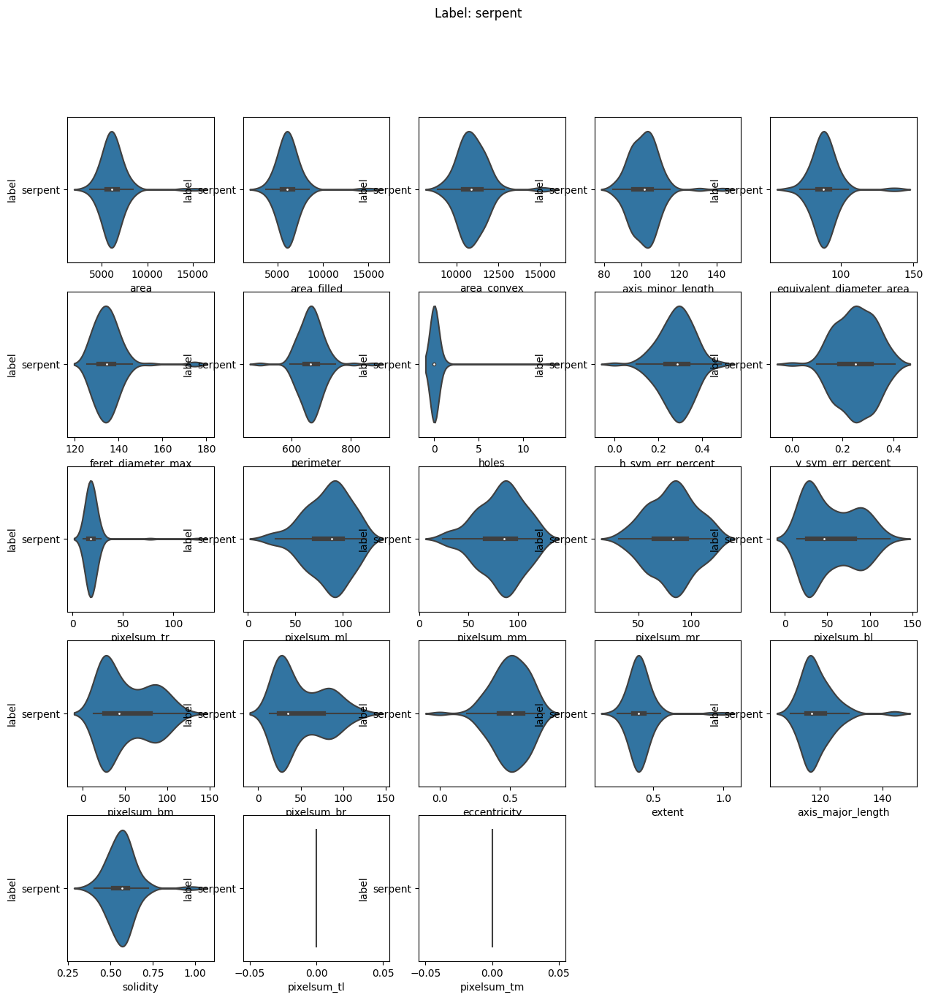

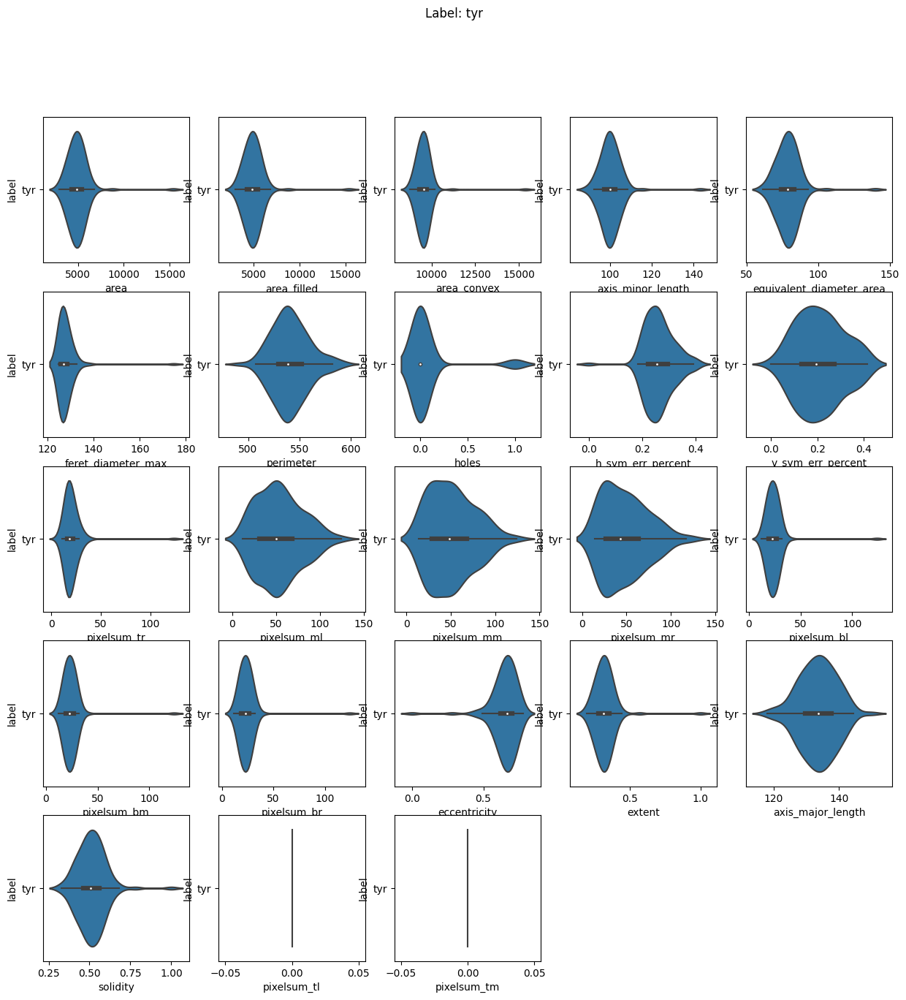

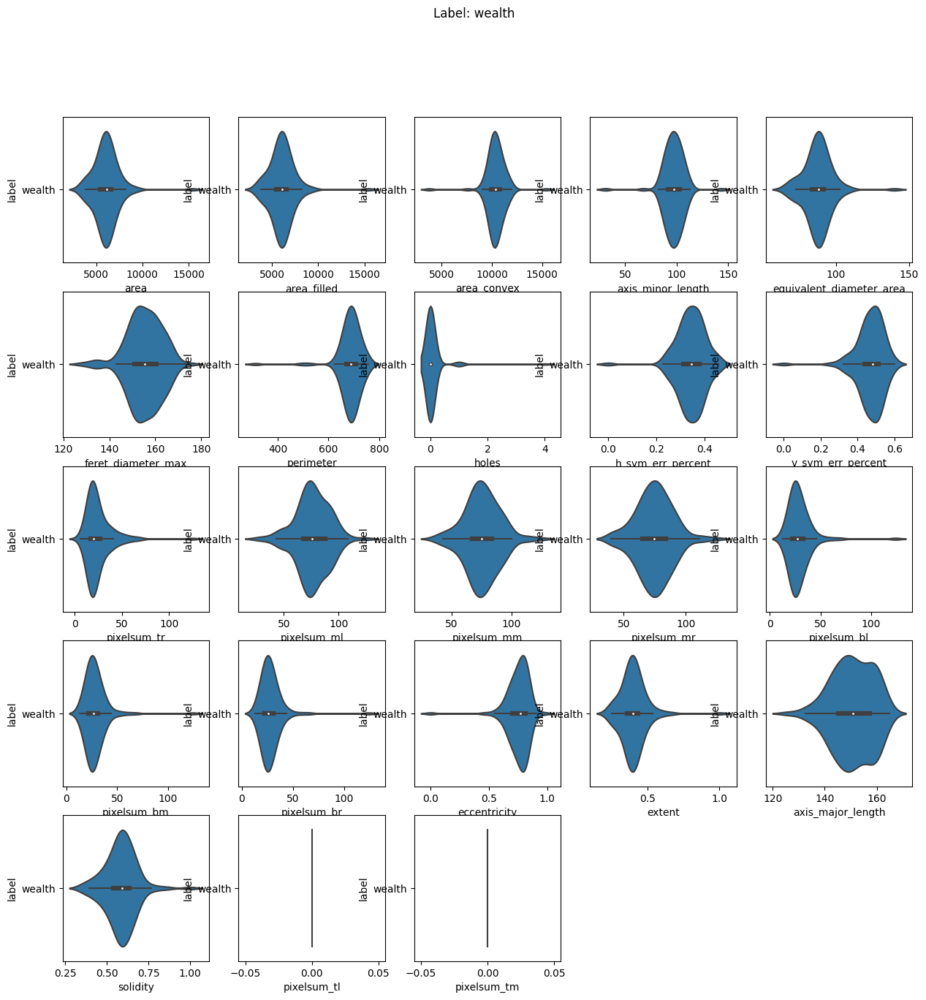

In [8]:
# area,area_filled,area_convex,axis_major_length,axis_minor_length,eccentricity,equivalent_diameter_area,extent,feret_diameter_max,perimeter,holes,h_sym_err_percent,v_sym_err_percent,pixelsum_tr,pixelsum_ml,pixelsum_mm,pixelsum_mr,pixelsum_bl,pixelsum_bm,pixelsum_br
for i, (label, image_set) in enumerate(images_dict.items()):
    fig, axs = plt.subplots(5, 5, figsize=(15, 15))
    fig.suptitle(f'Label: {label}')

    sns.violinplot(data=image_set, x='area', y='label', ax=axs[0, 0])
    sns.violinplot(data=image_set, x='area_filled', y='label', ax=axs[0, 1])
    sns.violinplot(data=image_set, x='area_convex', y='label', ax=axs[0, 2])
    sns.violinplot(data=image_set, x='axis_minor_length', y='label', ax=axs[0, 3])
    sns.violinplot(data=image_set, x='equivalent_diameter_area', y='label', ax=axs[0, 4])

    sns.violinplot(data=image_set, x='feret_diameter_max', y='label', ax=axs[1, 0])
    sns.violinplot(data=image_set, x='perimeter', y='label', ax=axs[1, 1])
    sns.violinplot(data=image_set, x='holes', y='label', ax=axs[1, 2])
    sns.violinplot(data=image_set, x='h_sym_err_percent', y='label', ax=axs[1, 3])
    sns.violinplot(data=image_set, x='v_sym_err_percent', y='label', ax=axs[1, 4])

    sns.violinplot(data=image_set, x='pixelsum_tr', y='label', ax=axs[2, 0])
    sns.violinplot(data=image_set, x='pixelsum_ml', y='label', ax=axs[2, 1])
    sns.violinplot(data=image_set, x='pixelsum_mm', y='label', ax=axs[2, 2])
    sns.violinplot(data=image_set, x='pixelsum_mr', y='label', ax=axs[2, 3])
    sns.violinplot(data=image_set, x='pixelsum_bl', y='label', ax=axs[2, 4])

    sns.violinplot(data=image_set, x='pixelsum_bm', y='label', ax=axs[3, 0])
    sns.violinplot(data=image_set, x='pixelsum_br', y='label', ax=axs[3, 1])
    sns.violinplot(data=image_set, x='eccentricity', y='label', ax=axs[3, 2])
    sns.violinplot(data=image_set, x='extent', y='label', ax=axs[3, 3])
    sns.violinplot(data=image_set, x='axis_major_length', y='label', ax=axs[3, 4])

    sns.violinplot(data=image_set, x='solidity', y='label', ax=axs[4, 0])
    sns.violinplot(data=image_set, x='pixelsum_tl', y='label', ax=axs[4, 1])
    sns.violinplot(data=image_set, x='pixelsum_tm', y='label', ax=axs[4, 2])
    
    # remove the last two plots
    axs[4, 3].axis('off')
    axs[4, 4].axis('off')
    plt.show()

### 6. Feature Selection

For our machine learning models, we want a lot of features, but only those features where there is no strong corelation. We do this, so each feature is unique and provides different data. We select 20 features out of our 23 features so we can have a lot of features, but we drop 3 where the feature set resembles others.

We use the `SelectKBest` algorithm with `chi2` for the automatic selection.

In [9]:
X = dataset.drop('label', axis=1)
y = dataset['label']

selector = SelectKBest(chi2, k=20)

X_new = selector.fit_transform(X, y)

selected_features = X.columns[selector.get_support()]

selected_features_df = pd.DataFrame(X_new, columns=selected_features)
selected_features_df['label'] = y

dropped_features = [col for col in dataset.columns if col not in selected_features]

print(selected_features_df.describe())

print(f'Dropped features: {dropped_features}')

               area   area_filled   area_convex  axis_major_length  \
count   1472.000000   1472.000000   1472.000000        1472.000000   
mean    6107.643342   6470.124321  11039.891984         143.646528   
std     1779.865675   2090.570961   1752.918338          16.273829   
min     1469.000000   1469.000000   1808.000000         110.482240   
25%     5013.250000   5085.000000   9668.750000         132.328105   
50%     5990.000000   6143.500000  10519.000000         142.231762   
75%     6853.500000   7304.500000  12155.250000         153.240164   
max    15376.000000  15376.000000  15376.000000         202.711313   

       axis_minor_length  eccentricity  equivalent_diameter_area       extent  \
count        1472.000000   1472.000000               1472.000000  1472.000000   
mean          104.686584      0.639563                 87.404364     0.398024   
std            14.929751      0.168373                 11.707400     0.115475   
min            14.198591      0.000000       

### 7. Save the data

Save our selected best features to a csv file for later use.

In [10]:
directory = "../dataset-numpy/" 
path = os.path.join(directory, '2.2 - features.csv')

selected_features_df.to_csv(path, index=False)